In [2]:
%matplotlib inline
import random
import pandas as pd
import numpy as np
import seaborn as sns
import nltk
import re
from konlpy.tag import Twitter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from matplotlib import font_manager, rc
from konlpy.utils import pprint
from nltk.corpus import stopwords
twitter = Twitter()
font_fname = '/Library/Fonts/AppleGothic.ttf'     # A font of your choice
font_name = font_manager.FontProperties(fname=font_fname).get_name()
rc('font', family=font_name)

In [3]:
import numpy as np
import scipy as sp
import pandas as pd
import statsmodels.api as sm
import statsmodels.formula.api as smf
import statsmodels.stats.api as sms
import sklearn as sk
from sklearn.cluster import KMeans
import matplotlib
import pylab
import re
import matplotlib.pylab as plt
from mpl_toolkits.mplot3d import Axes3D
import networkx as nx 
%matplotlib inline
import seaborn as sns
sns.set()
sns.set_style("whitegrid")
sns.set_color_codes()


/Library/anaconda3/lib/python3.6/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


#  데이터 전처리

- 데이터 불러오기

In [6]:
df = pd.read_json("clustering1.csv.xml.json")
df = df.drop("id", axis=1)

In [7]:
df = df[["name","candidate","info"]]

In [8]:
df.tail()

,name,candidate,info
1285,is it fresh,"전기, 전자",Is it fresh GmbH (www.is-it-fresh.com) is a st...
1286,엘오케이(L'Oreal Korea),소비재/제조,"105년이 넘는 역사를 지닌 로레알 그룹은 세계 뷰티 시장의 리더로서, 전 세계 여..."
1287,제이밸류인베스트,금융,투자자문사
1288,윤익(Yooniq),IT,윤익이미지는 ‘아시아를 대표하는 스톡 콘텐츠 회사’가 되기 위해 먼저 아시아 콘텐츠...
1289,리스트(LiST),IT,LiST는 Linked Data를 통해 데이터가 우리가 사는 실제 생활에서 활용될 ...


- 필요한 열 및 한국기업만 뽑아내기 / 중복회사 제거

In [9]:
info_tbl = df.drop_duplicates(u'name')
# 이름 중복인것 뽑아내기
info_tbl.reset_index(inplace=True)
info_tbl = info_tbl.drop(u"index", axis=1)

In [33]:
info_tbl.tail()

,name,candidate,info,word_count
1150,마이쿤,IT,스푼라디오는 스마트폰만 있으면 누구나 한 번의 터치로 스푼을 통해 라디오 방송을 할...,625
1151,is it fresh,"전기,전자",...,61
1152,엘오케이(L'Oreal Korea),"전기,전자",년이 넘는 역사를 지닌 로레알 그룹은 세계 뷰티 시장의 리더로서 전 세계 여성과 남...,599
1153,윤익(Yooniq),IT,윤익이미지는 아시아를 대표하는 스톡 콘텐츠 회사가 되기 위해 먼저 아시아 콘텐츠 문...,516
1154,리스트(LiST),IT,는 를 통해 데이터가 우리가 사는 실제 생활에서 활용될 수 있도록 기술 개발과 확...,125


In [11]:
# 이름에 중복이라고 쓰여있는 것 빼버리기 ex)wanted_lab 중복, wanted_lab
def copy(x):
    if u"중복" in x:
        return u"중복"
    else:
        return x

In [12]:
info_tbl = info_tbl[info_tbl[u"name"].map(copy) != u"중복"]

- 한국어 처리를 할 것이므로 -> 영어로 된 것들은 버리기

In [13]:
def test(x):
    hangul = re.compile('[^ ㄱ-ㅣ가-힣]+')
    result = hangul.sub('', x)
    return result

In [14]:
info_tbl["info"] = info_tbl["info"].map(test)

- 기업소개 글자수 카운트

In [15]:
info_tbl["word_count"] = info_tbl["info"].apply(lambda x : len(x))

In [16]:
info_tbl["word_count"].describe()

count    1287.000000
mean      274.937840
std       256.335807
min         0.000000
25%       118.000000
50%       208.000000
75%       358.000000
max      3114.000000
Name: word_count, dtype: float64

(0, 1000)

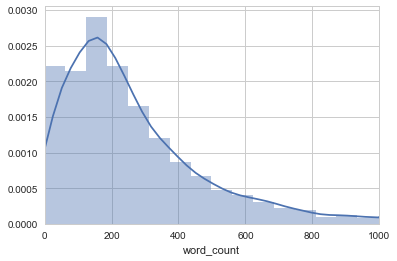

In [17]:
sns.distplot(info_tbl["word_count"])
plt.xlim(0,1000)

- 기업 설명으로 적합한 50글자 이상(2문장 정도) 및 10%의 데이터를 고려하여 46글자 미만인 것은 버리기로 결정

In [18]:
np.percentile(info_tbl["word_count"],10)

46.0

- 글자수가 100 이하인 것들은 제외시키기(230개 정도 제외)

: 제외된 것은 추가적 크롤링 및 뉴스기간 추가 필요!

In [19]:
info_tbl = info_tbl[info_tbl[u"info"].apply(lambda x : True if len(x) > 46 else False)]
info_tbl.reset_index(inplace=True)
info_tbl = info_tbl.drop(u"index", axis=1)

In [34]:
info_tbl.tail()

,name,candidate,info,word_count
1150,마이쿤,IT,스푼라디오는 스마트폰만 있으면 누구나 한 번의 터치로 스푼을 통해 라디오 방송을 할...,625
1151,is it fresh,"전기,전자",...,61
1152,엘오케이(L'Oreal Korea),"전기,전자",년이 넘는 역사를 지닌 로레알 그룹은 세계 뷰티 시장의 리더로서 전 세계 여성과 남...,599
1153,윤익(Yooniq),IT,윤익이미지는 아시아를 대표하는 스톡 콘텐츠 회사가 되기 위해 먼저 아시아 콘텐츠 문...,516
1154,리스트(LiST),IT,는 를 통해 데이터가 우리가 사는 실제 생활에서 활용될 수 있도록 기술 개발과 확...,125


- 데이터가 130개가 줄어 들었으며, 이에 대해서는 추가적으로 웹사이트 및 신문기사 크롤링으로 실시 가능

# 각 산업군별 통일 시켜주기

In [21]:
def str_replace(x):

    return x.replace(" ","")
    

In [22]:
info_tbl["candidate"] = info_tbl["candidate"].map(str_replace)

- 금융 = 금융,보험,부동산 / 금융,은행
- 소비재 =  소비재/제조
- net 개발자는 인터넷 미디어 이므로 미디어로 바꾸자
- 제약, 바이오도 의료 헬스케어로 바꾸자

In [23]:
info_tbl["candidate"] = info_tbl["candidate"].replace(["금융,보험,부동산","금융,은행"],"금융")
info_tbl["candidate"] = info_tbl["candidate"].replace(["소비재/제조","소비재"])
info_tbl["candidate"] = info_tbl["candidate"].replace([".NET개발자","미디어,Ent."])
info_tbl["candidate"] = info_tbl["candidate"].replace(["제약,바이오","의로,헬스케어"])

In [24]:
info_tbl["candidate"].value_counts()

IT          663
판매,유통        76
게임           75
마케팅,광고       60
금융           51
교육,연구        38
컨설팅          34
의료,헬스케어      31
외식업,식음료      25
전기,전자        25
여행,호텔,항공     20
스포츠,여가       13
기관,협회        12
물류,운송         9
건설,에너지        9
부동산           8
기계,설비,오토      6
Name: candidate, dtype: int64

- 추가적으로 고민해볼문제 

: 직군간의 유사성을 나타낼 필요가 있음 

# stopwords 구하기

- corpus 만든 후 (list로 만들면 안됨) / count

In [25]:
corpus = ""
for i,j in enumerate(info_tbl['info']):
    corpus += j 

In [26]:
tokens_ko = twitter.morphs(corpus)
ko = nltk.Text(tokens_ko)

In [27]:
print(len(ko.tokens))

136076


In [28]:
print(len(set(ko.tokens)))

10873


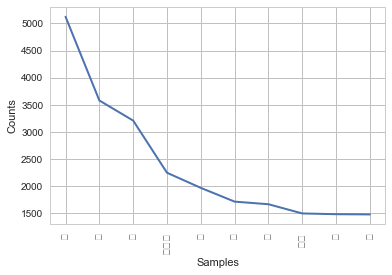

In [29]:
ko.plot(10)

- 많이 나온 것들은 조사, 어미 같은 것들
- 기업 의미를 담고 있는 것은 명사만 해당한다고 가정 / 명사인 것만 추출

In [30]:
noun_text = Twitter().nouns(corpus)

In [31]:
len(noun_text)

73723

- 명사중에서 개수가 많은 것 골라내기 
: 상위 100개 중에서 구분해내는데 필요없는 것들 제외시키기(domain 지식이 필요)


- 100개 중에서만 골라도 될 것인가????????200개까지 해야되는 것인지.. 이에 대한 기준이 필요! **

-> %로 보면 5%를 기준으로 잡으면 상위 200개 단위까지 빼버리면 가능할듯

In [32]:
text = nltk.Text(noun_text)
freq = nltk.FreqDist(text)

In [38]:
stopword = []

for i in range(len(freq.most_common(200))):
    stopword.append(freq.most_common(200)[i][0])

In [39]:
# 국내, 글로벌, 스타트업, 세계, 한국, 광고, 미국, 투자 등을 제거!

- 불용어 목록(https://github.com/6/stopwords-json/blob/master/dist/ko.json#L1)


In [40]:
stopwords1 = ["!","\"","$","%","&","'","(",")","*","+",",","-",".","...","0","1","2","3","4","5","6","7","8","9",";","<","=",">","?","@","\\","^","_","`","|","~","·","—","——","‘","’","“","”","…","、","。","〈","〉","《","》","가","가까스로","가령","각","각각","각자","각종","갖고말하자면","같다","같이","개의치않고","거니와","거바","거의","것","것과 같이","것들","게다가","게우다","겨우","견지에서","결과에 이르다","결국","결론을 낼 수 있다","겸사겸사","고려하면","고로","곧","공동으로","과","과연","관계가 있다","관계없이","관련이 있다","관하여","관한","관해서는","구","구체적으로","구토하다","그","그들","그때","그래","그래도","그래서","그러나","그러니","그러니까","그러면","그러므로","그러한즉","그런 까닭에","그런데","그런즉","그럼","그럼에도 불구하고","그렇게 함으로써","그렇지","그렇지 않다면","그렇지 않으면","그렇지만","그렇지않으면","그리고","그리하여","그만이다","그에 따르는","그위에","그저","그중에서","그치지 않다","근거로","근거하여","기대여","기점으로","기준으로","기타","까닭으로","까악","까지","까지 미치다","까지도","꽈당","끙끙","끼익","나","나머지는","남들","남짓","너","너희","너희들","네","넷","년","논하지 않다","놀라다","누가 알겠는가","누구","다른","다른 방면으로","다만","다섯","다소","다수","다시 말하자면","다시말하면","다음","다음에","다음으로","단지","답다","당신","당장","대로 하다","대하면","대하여","대해 말하자면","대해서","댕그","더구나","더군다나","더라도","더불어","더욱더","더욱이는","도달하다","도착하다","동시에","동안","된바에야","된이상","두번째로","둘","둥둥","뒤따라","뒤이어","든간에","들","등","등등","딩동","따라","따라서","따위","따지지 않다","딱","때","때가 되어","때문에","또","또한","뚝뚝","라 해도","령","로","로 인하여","로부터","로써","륙","를","마음대로","마저","마저도","마치","막론하고","만 못하다","만약","만약에","만은 아니다","만이 아니다","만일","만큼","말하자면","말할것도 없고","매","매번","메쓰겁다","몇","모","모두","무렵","무릎쓰고","무슨","무엇","무엇때문에","물론","및","바꾸어말하면","바꾸어말하자면","바꾸어서 말하면","바꾸어서 한다면","바꿔 말하면","바로","바와같이","밖에 안된다","반대로","반대로 말하자면","반드시","버금","보는데서","보다더","보드득","본대로","봐","봐라","부류의 사람들","부터","불구하고","불문하고","붕붕","비걱거리다","비교적","비길수 없다","비로소","비록","비슷하다","비추어 보아","비하면","뿐만 아니라","뿐만아니라","뿐이다","삐걱","삐걱거리다","사","삼","상대적으로 말하자면","생각한대로","설령","설마","설사","셋","소생","소인","솨","쉿","습니까","습니다","시각","시간","시작하여","시초에","시키다","실로","심지어","아","아니","아니나다를가","아니라면","아니면","아니었다면","아래윗","아무거나","아무도","아야","아울러","아이","아이고","아이구","아이야","아이쿠","아하","아홉","안 그러면","않기 위하여","않기 위해서","알 수 있다","알았어","앗","앞에서","앞의것","야","약간","양자","어","어기여차","어느","어느 년도","어느것","어느곳","어느때","어느쪽","어느해","어디","어때","어떠한","어떤","어떤것","어떤것들","어떻게","어떻해","어이","어째서","어쨋든","어쩔수 없다","어찌","어찌됏든","어찌됏어","어찌하든지","어찌하여","언제","언젠가","얼마","얼마 안 되는 것","얼마간","얼마나","얼마든지","얼마만큼","얼마큼","엉엉","에","에 가서","에 달려 있다","에 대해","에 있다","에 한하다","에게","에서","여","여기","여덟","여러분","여보시오","여부","여섯","여전히","여차","연관되다","연이서","영","영차","옆사람","예","예를 들면","예를 들자면","예컨대","예하면","오","오로지","오르다","오자마자","오직","오호","오히려","와","와 같은 사람들","와르르","와아","왜","왜냐하면","외에도","요만큼","요만한 것","요만한걸","요컨대","우르르","우리","우리들","우선","우에 종합한것과같이","운운","월","위에서 서술한바와같이","위하여","위해서","윙윙","육","으로","으로 인하여","으로서","으로써","을","응","응당","의","의거하여","의지하여","의해","의해되다","의해서","이","이 되다","이 때문에","이 밖에","이 외에","이 정도의","이것","이곳","이때","이라면","이래","이러이러하다","이러한","이런","이럴정도로","이렇게 많은 것","이렇게되면","이렇게말하자면","이렇구나","이로 인하여","이르기까지","이리하여","이만큼","이번","이봐","이상","이어서","이었다","이와 같다","이와 같은","이와 반대로","이와같다면","이외에도","이용하여","이유만으로","이젠","이지만","이쪽","이천구","이천육","이천칠","이천팔","인 듯하다","인젠","일","일것이다","일곱","일단","일때","일반적으로","일지라도","임에 틀림없다","입각하여","입장에서","잇따라","있다","자","자기","자기집","자마자","자신","잠깐","잠시","저","저것","저것만큼","저기","저쪽","저희","전부","전자","전후","점에서 보아","정도에 이르다","제","제각기","제외하고","조금","조차","조차도","졸졸","좀","좋아","좍좍","주룩주룩","주저하지 않고","줄은 몰랏다","줄은모른다","중에서","중의하나","즈음하여","즉","즉시","지든지","지만","지말고","진짜로","쪽으로","차라리","참","참나","첫번째로","쳇","총적으로","총적으로 말하면","총적으로 보면","칠","콸콸","쾅쾅","쿵","타다","타인","탕탕","토하다","통하여","툭","퉤","틈타","팍","팔","퍽","펄렁","하","하게될것이다","하게하다","하겠는가","하고 있다","하고있었다","하곤하였다","하구나","하기 때문에","하기 위하여","하기는한데","하기만 하면","하기보다는","하기에","하나","하느니","하는 김에","하는 편이 낫다","하는것도","하는것만 못하다","하는것이 낫다","하는바","하더라도","하도다","하도록시키다","하도록하다","하든지","하려고하다","하마터면","하면 할수록","하면된다","하면서","하물며","하여금","하여야","하자마자","하지 않는다면","하지 않도록","하지마","하지마라","하지만","하하","한 까닭에","한 이유는","한 후","한다면","한다면 몰라도","한데","한마디","한적이있다","한켠으로는","한항목","할 따름이다","할 생각이다","할 줄 안다","할 지경이다","할 힘이 있다","할때","할만하다","할망정","할뿐","할수있다","할수있어","할줄알다","할지라도","할지언정","함께","해도된다","해도좋다","해봐요","해서는 안된다","해야한다","해요","했어요","향하다","향하여","향해서","허","허걱","허허","헉","헉헉","헐떡헐떡","형식으로 쓰여","혹시","혹은","혼자","훨씬","휘익","휴","흐흐","흥","힘입어","︿","！","＃","＄","％","＆","（","）","＊","＋","，","０","１","２","３","４","５","６","７","８","９","：","；","＜","＞","？","＠","［","］","｛","｜","｝","～","￥"]

In [41]:
stopwords2 = info_tbl["name"]

In [42]:
stopwords = stopword + stopwords1 + list(stopwords2)

# 1. IT 기업내에서 유사도 계산(countvectorizer -> TfidTransformer)

In [43]:
info_tbl_IT = info_tbl[info_tbl["candidate"] == "IT"]

- tokenizer 정의

In [44]:
def tokenizer(text):
    tokens = [word for word in twitter.nouns(text) if word not in stopwords]
    return tokens

- countvectorizer
: 일반적으로 벡터 사이즈는 300으로 잡아줌

In [45]:
vector_size = 300

tf = CountVectorizer(tokenizer= tokenizer, min_df=1, max_features=vector_size)

In [46]:
token_dict = {}
for index, row in info_tbl_IT.iterrows():
    token_dict[row["name"]] = row["info"]

- tfid-transformer

In [47]:
%%time
X = tf.fit_transform(token_dict.values())
counts = X.toarray()
transformer = TfidfTransformer()
tfidf = transformer.fit_transform(counts)  
tfidf_arr = tfidf.toarray()

CPU times: user 6.44 s, sys: 32.8 ms, total: 6.47 s
Wall time: 4.87 s


In [48]:
tfidf_arr

array([[ 0.        ,  0.        ,  0.        , ...,  0.12149411,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       ..., 
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.28561746,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ]])

- nearestneighbors

In [49]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
nbrs = NearestNeighbors(n_neighbors=4, algorithm='auto', metric ='cosine').fit(tfidf_arr)
# 네이버후드 숫자에 따라서 리스트 갯수가 정해짐
distances, indices = nbrs.kneighbors(tfidf_arr)

label_to_index = {}
index_to_label = {}
for index, item in enumerate(token_dict.keys()):
    label_to_index[item] = index
    index_to_label[index]=item
    
top3_df = pd.DataFrame(columns=[['target','top1','top2','top3']])
for i in range(indices.shape[0]):
    top3_df.loc[len(top3_df)] = [index_to_label[elem] for elem in indices[i]]

In [50]:
nbrs = NearestNeighbors(n_neighbors=4, algorithm='auto', metric ='cosine').fit(tfidf_arr)
distances, indices = nbrs.kneighbors(tfidf_arr)

In [51]:
nbrs.kneighbors_graph(tfidf_arr).toarray()

array([[ 1.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  1.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  1., ...,  0.,  0.,  0.],
       ..., 
       [ 0.,  0.,  0., ...,  1.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  1.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  1.]])

In [52]:
distances[0]

array([ 0.        ,  0.61625248,  0.65081142,  0.69990927])

In [53]:
top3_df

,target,top1,top2,top3
0,퓨쳐스트림네트웍스(Cauly),드림플러스프로덕션,야놀자트래블(야놀자펜션),메쉬코리아(MeshKorea)
1,빙글(Vingle),와플러스,SK플래닛(SKP),디자이어랩
2,리디(RIDI),커브(curvc),29CM(에이플러스비),컴팩트디
3,카닥,오토위니,미디어앤아트,스테이지(세차왕)
4,스타일쉐어,뷰티인앱,휴마트컴퍼니,크로키닷컴(ZIGZAG/지그재그)
5,미미박스(MEMEBOX),아이오이소프트(i52),이음소시어스(ium),카랩
6,엠버스,쓰리디시스템즈코리아(3DSystemsKorea),필링크아이,카카오메이커스
7,밸런스히어로,레저큐,밸류포션 (Valuepotion),투아이피(2ip)
8,웨이웨어러블,쉐어앤케어,유라이크코리아,차케어(Chacare)
9,인포뱅크,시리우스소프트,포인투테크놀로지,에이프릴세븐


In [53]:
rel = []
for i in range(int(len(top3_df))):
    for j in range(0,3):
        rel.append((top3_df.iloc[i,0],top3_df.iloc[i,j]))

In [59]:
plt.figure(figsize=(100,100))
G = nx.Graph()
G.add_edges_from(rel)
d = nx.degree(G)
G.size = 100
nx.draw(G, node_color="b",font_family="AppleGothic", with_labels=True, font_size=20, node_size=[v * 200 for v in d.values()])
plt.show()

/Library/anaconda3/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:126: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  b = plt.ishold()
/Library/anaconda3/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:138: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  plt.hold(b)
/Library/anaconda3/lib/python3.6/site-packages/matplotlib/__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
/Library/anaconda3/lib/python3.6/site-packages/matplotlib/rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, wi

# 2. 판매 유통내에서 유사도 계산

In [64]:
info_tbl[info_tbl.candidate =="판매,유통"]

,name,candidate,info,word_count
58,언니의파우치(LYCL),"판매,유통",언니의파우치는 조 규모의 국내 화장품 시장에서 가장 빠르게 성장하는 뷰티 플랫폼입니...,325
64,번개장터(셀잇),"판매,유통",번개장터 주식회사는 대한민국 등 중고거래 앱 번개장터 와 대한민국 등 중고거래 컨시...,379
84,링크샵스(April),"판매,유통",에이프릴은 년 월 일 설립 이후 약 년간을 쉼없이 달려온 스타트업입니다 지난 년간의...,249
90,서울스토어,"판매,유통",디유닛은 성장하는 아시아의 모바일과 이커머스 시장에 사용자 경험과 브랜드 경험의 노...,219
100,테일러블(Tailorable&Co),"판매,유통",은 비스포크 수트를 만드는 전문화된 테일러샵으로써 년 서울 한남동에 첫번째 부티크를...,807
105,비투링크(B2LINK),"판매,유통",비투링크는 국내 뷰티 기업의 중국동남아시아 등 해외진출을 돕는 원스탑 글로벌 유통 ...,229
112,쓰리클랩스(3Claps),"판매,유통",클랩스는 년 월 정식 런칭한 이래 매월 매출이 이상 증가하는 등 빠르게 성장해왔습...,279
113,모두컴퍼니(모두의주차장),"판매,유통",주모두컴퍼니는 년 월 법인을 설립하여 같은 해 월 주차정보 앱 모두의주차장을 런칭하...,554
145,캐주얼스텝스(스내피),"판매,유통",스내피를 운영하는 캐주얼스텝스는 년 법인 설립 이후로 계속 크로스보더 쇼핑에 집중해...,283
155,제이피컴퍼니,"판매,유통",주제이피 컴퍼니는 년 설립되었으며 년부터 화장품 사업을 시작한 로서 현재 만 명의...,496


In [65]:
info_tbl_sales = info_tbl[info_tbl["candidate"] == "판매,유통"]

- tokenizer 정의

In [66]:
def tokenizer(text):
    tokens = [word for word in twitter.nouns(text) if word not in stopwords]
    return tokens

- countvectorizer
: 일반적으로 벡터 사이즈는 300으로 잡아줌

In [67]:
vector_size = 300

tf = CountVectorizer(tokenizer= tokenizer, min_df=1, max_features=vector_size)

In [76]:
token_dict = {}
for index, row in info_tbl_sales.iterrows():
    token_dict[row["name"]] = row["info"]

- tfid-transformer

In [77]:
%%time
X = tf.fit_transform(token_dict.values())
counts = X.toarray()
transformer = TfidfTransformer()
tfidf = transformer.fit_transform(counts)  
tfidf_arr = tfidf.toarray()

CPU times: user 574 ms, sys: 4.75 ms, total: 579 ms
Wall time: 572 ms


In [78]:
tfidf_arr

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       ..., 
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.10955306,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ]])

- nearestneighbors

In [79]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
nbrs = NearestNeighbors(n_neighbors=4, algorithm='auto', metric ='cosine').fit(tfidf_arr)
# 네이버후드 숫자에 따라서 리스트 갯수가 정해짐
distances, indices = nbrs.kneighbors(tfidf_arr)

label_to_index = {}
index_to_label = {}
for index, item in enumerate(token_dict.keys()):
    label_to_index[item] = index
    index_to_label[index]=item
    
top3_df = pd.DataFrame(columns=[['target','top1','top2','top3']])
for i in range(indices.shape[0]):
    top3_df.loc[len(top3_df)] = [index_to_label[elem] for elem in indices[i]]

In [80]:
nbrs = NearestNeighbors(n_neighbors=4, algorithm='auto', metric ='cosine').fit(tfidf_arr)
distances, indices = nbrs.kneighbors(tfidf_arr)

In [81]:
nbrs.kneighbors_graph(tfidf_arr).toarray()

array([[ 1.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  1.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  1., ...,  0.,  0.,  0.],
       ..., 
       [ 0.,  0.,  0., ...,  1.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  1.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  1.]])

In [82]:
distances[0]

array([ 0.        ,  0.79729835,  0.81249213,  0.88705037])

In [83]:
top3_df

,target,top1,top2,top3
0,언니의파우치(LYCL),에이프릴스킨,꽃피는아침마을,아로마티카
1,번개장터(셀잇),JRTrade,폼웨이,텐바이텐
2,링크샵스(April),제이피컴퍼니,에이프릴스킨,비투링크(B2LINK)
3,서울스토어,아이엑스,공팔리터(08L),에프앤에프(F&F)
4,테일러블(Tailorable&Co),슈퍼텍스앤컴퍼니,몽클레르신세계,피피비스튜디오스(PPB Studios Co.)
5,비투링크(B2LINK),아이오앤코 코리아,링크샵스(April),알테아(Althea)
6,쓰리클랩스(3Claps),트릴리어네어,알테아(Althea),코리아세븐
7,모두컴퍼니(모두의주차장),더클로젯컴퍼니,미니소인터네셔날,서울스토어
8,캐주얼스텝스(스내피),파란하늘시스템,제이피컴퍼니,카파코리아
9,제이피컴퍼니,GS SHOP,캐주얼스텝스(스내피),씨엠에스랩(CMSLAB)


In [87]:
rel = []
for i in range(int(len(top3_df))):
    for j in range(0,4):
        rel.append((top3_df.iloc[i,0],top3_df.iloc[i,j]))

In [90]:
plt.figure(figsize=(100,100))
G = nx.Graph()
G.add_edges_from(rel)
d = nx.degree(G)
G.size = 100
nx.draw(G, node_color="b",font_family="AppleGothic", with_labels=True, font_size=100, node_size=[v * 400 for v in d.values()])
plt.show()

/Library/anaconda3/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:126: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  b = plt.ishold()
/Library/anaconda3/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:138: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  plt.hold(b)
/Library/anaconda3/lib/python3.6/site-packages/matplotlib/__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
/Library/anaconda3/lib/python3.6/site-packages/matplotlib/rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, wi

# 3. word2vec으로 단어 확장 시키고 유사도 계산

In [160]:
from gensim.models import word2vec
model = word2vec.Word2Vec.load('/Users/ha/Desktop/Study/nlp/wiki2.model')

In [161]:
def most_similar_word(x):

    for i in range(len(np.array(model.most_similar(x, topn=5)))):
        if float(np.array(model.most_similar(x, topn=5))[i][1]) > 0.7: 
            a_list.append(np.array(model.most_similar(x, topn=5))[i][0])
        else:
            pass
    return list(np.array(model.most_similar(x, topn=5))[:,0])

In [162]:
def similar_list_regex(x):
    hangul_list = []
    hangul = r'[가-힣]+' 
    
    for i in range(len(x)):
        result = re.findall(hangul,x[i])
        if len(result) > 0:
            hangul_list.append("".join(result))
    return hangul_list

In [163]:
def noun_similar(x):
    empty = []
    for i,j in enumerate(x):
        try:
            empty = empty+ most_similar_word(j)
        except Exception as e:
            pass
    return empty

In [164]:
def return_list(x):

    corpus = ""
    
    for i,j in enumerate(x):
        corpus += j 

    tokens_ko = twitter.morphs(corpus)
    ko = nltk.Text(tokens_ko)
    noun_text = Twitter().nouns(corpus)
    noun_text = noun_similar(noun_text)
    
    return similar_list_regex(noun_text)

In [166]:
info_tbl["info_1"] = info_tbl["info"].map(return_list)

In [167]:
def list_to_str(x):
    return ' '.join(str(e) for e in x)

In [168]:
info_tbl["info_1"] = info_tbl["info_1"].map(list_to_str)

In [169]:
info_tbl["info_1"] = info_tbl["info"] + info_tbl["info_1"]

In [184]:
# info_tbl.to_csv("word2vec.csv")
# pd.read_csv("word2vec.csv)

- Countvectorizer -> Tfidtransformer

In [172]:
info_tbl_sales = info_tbl[info_tbl["candidate"] == "판매,유통"]

- tokenizer 정의

In [173]:
def tokenizer(text):
    tokens = [word for word in twitter.nouns(text) if word not in stopwords]
    return tokens

- countvectorizer
: 일반적으로 벡터 사이즈는 300으로 잡아줌

In [174]:
vector_size = 300

tf = CountVectorizer(tokenizer= tokenizer, min_df=1, max_features=vector_size)

In [175]:
token_dict = {}
for index, row in info_tbl_sales.iterrows():
    token_dict[row["name"]] = row["info_1"]

- tfid-transformer

In [176]:
%%time
X = tf.fit_transform(token_dict.values())
counts = X.toarray()
transformer = TfidfTransformer()
tfidf = transformer.fit_transform(counts)  
tfidf_arr = tfidf.toarray()

CPU times: user 1.46 s, sys: 4.47 ms, total: 1.47 s
Wall time: 1.45 s


In [177]:
tfidf_arr

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.05410804,  0.        ],
       [ 0.        ,  0.12487096,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.215234  ,  0.        , ...,  0.14348933,
         0.06820268,  0.        ],
       ..., 
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.0456044 , ...,  0.        ,
         0.05970589,  0.        ],
       [ 0.        ,  0.        ,  0.16646313, ...,  0.        ,
         0.14529051,  0.        ]])

- nearestneighbors

In [178]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
nbrs = NearestNeighbors(n_neighbors=4, algorithm='auto', metric ='cosine').fit(tfidf_arr)
# 네이버후드 숫자에 따라서 리스트 갯수가 정해짐
distances, indices = nbrs.kneighbors(tfidf_arr)

label_to_index = {}
index_to_label = {}
for index, item in enumerate(token_dict.keys()):
    label_to_index[item] = index
    index_to_label[index]=item
    
top3_df = pd.DataFrame(columns=[['target','top1','top2','top3']])
for i in range(indices.shape[0]):
    top3_df.loc[len(top3_df)] = [index_to_label[elem] for elem in indices[i]]

In [179]:
nbrs = NearestNeighbors(n_neighbors=4, algorithm='auto', metric ='cosine').fit(tfidf_arr)
distances, indices = nbrs.kneighbors(tfidf_arr)

In [180]:
nbrs.kneighbors_graph(tfidf_arr).toarray()

array([[ 1.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  1.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  1., ...,  0.,  0.,  0.],
       ..., 
       [ 0.,  0.,  0., ...,  1.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  1.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  1.]])

In [181]:
top3_df

,target,top1,top2,top3
0,언니의파우치(LYCL),비모뉴먼트,제이피컴퍼니,에이프릴스킨
1,번개장터(셀잇),제이피컴퍼니,비투링크(B2LINK),텐바이텐
2,링크샵스(April),스트라입스(Stripes),토픽이미지스,트릴리어네어
3,서울스토어,더클로젯컴퍼니,카파코리아,씨엠에스랩(CMSLAB)
4,테일러블(Tailorable&Co),스트라입스(Stripes),아이엑스,SOUL BOOSTER
5,비투링크(B2LINK),아이오앤코 코리아,글로트렉트레이드(Glotrek),비모뉴먼트
6,쓰리클랩스(3Claps),링크샵스(April),피피비스튜디오스(PPB Studios Co.),스트라입스(Stripes)
7,모두컴퍼니(모두의주차장),스트라입스(Stripes),신한카드차투차,더클로젯컴퍼니
8,캐주얼스텝스(스내피),ISE Commerce,링크샵스(April),대송
9,제이피컴퍼니,비모뉴먼트,알테아(Althea),언니의파우치(LYCL)


In [182]:
rel = []
for i in range(int(len(top3_df))):
    for j in range(0,3):
        rel.append((top3_df.iloc[i,0],top3_df.iloc[i,j]))

In [183]:
plt.figure(figsize=(100,100))
G = nx.Graph()
G.add_edges_from(rel)
d = nx.degree(G)
G.size = 100
nx.draw(G, node_color="b",font_family="AppleGothic", with_labels=True, font_size=100, node_size=[v * 400 for v in d.values()])
plt.show()

/Library/anaconda3/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:126: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  b = plt.ishold()
/Library/anaconda3/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:138: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  plt.hold(b)
/Library/anaconda3/lib/python3.6/site-packages/matplotlib/__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
/Library/anaconda3/lib/python3.6/site-packages/matplotlib/rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, wi

# 다른 plan
<성능면에서>
- word2vec이용해보기


<장기>
- (장기 plan) word2vec 학습 시키기 위한 데이터 모으기 (크롤링 / 뉴스 등) / 제외시킨 데이터 열 자료보충하기(크롤링 등)